# BOVW method on AT & T dataset



Mounted at /content/drive
len of train label 200
len of train img 200
len of test label 50
len of test img  50


/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


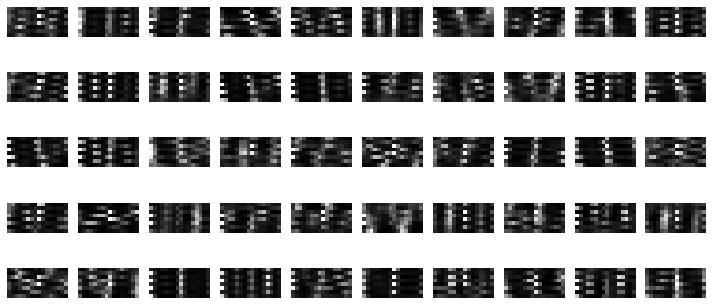

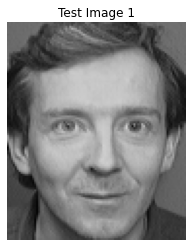

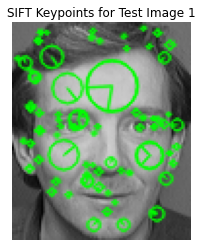

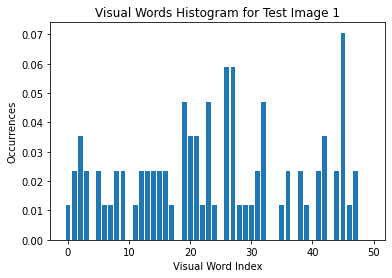

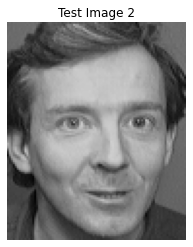

...

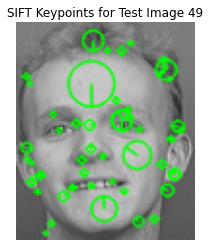

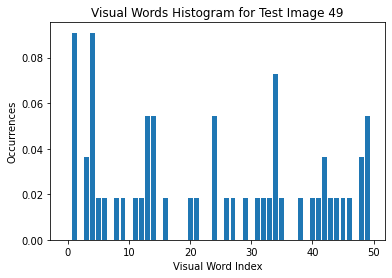

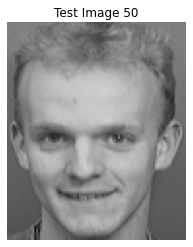

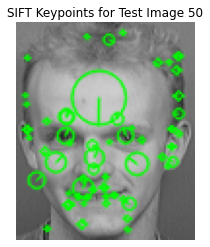

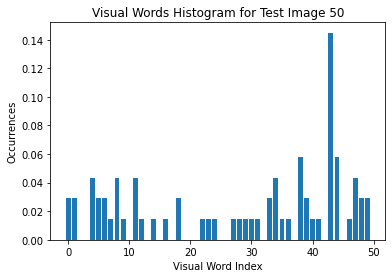

In [1]:
import cv2
import numpy as np
import os
from sklearn.metrics import accuracy_score, recall_score, precision_score
from google.colab.patches import cv2_imshow
from google.colab import drive
drive.mount('/content/drive')
path = "/content/drive/MyDrive/computer_vision/project1/AT_T"
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.cluster import KMeans

files_list = []
for root, dirs, files in os.walk(path):
    for f in files:
        files_list.append((os.path.join(root, f)))

train_list = []
train_label = []
test_list = []
test_label = []

for i in files_list:
    temp = i.split(".")[0]
    temp_list = temp.split("/")
    target = temp_list[-2]
    image_no = temp_list[-1]
    if int(image_no) >=9:
        test_list.append(i)
        test_label.append(target)
    else:
        train_list.append(i)
        train_label.append(target)


train_set = set(train_label)
count1 = 0
dict_lab = {}
for i in train_set:
    dict_lab[i] = count1
    count1+=1
for i in range(len(train_label)):
    train_label[i] = dict_lab[train_label[i]]
for i in range(len(test_label)):
    test_label[i] = dict_lab[test_label[i]]


# Load train images and labels
train_images = []
train_labels = []
for i in range(0, len(train_list)):  
    
    img = cv2.imread(train_list[i])

    train_images.append(img)
    label = train_label[i]
    
    train_labels.append(label)
# Load test images and labels
test_images = []
test_labels = []
for i in range(0, len(test_list)):  

    img = cv2.imread(test_list[i])
    test_images.append(img)
    label = test_label[i]
    
    test_labels.append(label)


print("len of train label",len(train_labels))
print("len of train img",len(train_images))
print("len of test label",len(test_labels))
print("len of test img ",len(test_images))


import numpy as np
from sklearn.cluster import KMeans
from sklearn.svm import SVC
import cv2

# Define the number of clusters (visual words)
num_clusters = 50

# Initialize the SIFT feature detector and descriptor
sift = cv2.xfeatures2d.SIFT_create()

# Extract features from the train images
train_features = []
for img in train_images:
    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Detect and compute keypoints and descriptors using SIFT
    kp, des = sift.detectAndCompute(gray, None)
    # Add the descriptors to the list of features
    train_features.append(des)

# Concatenate the features into a single array
train_features = np.concatenate(train_features)

# Cluster the features into visual words
kmeans = KMeans(n_clusters=num_clusters).fit(train_features)

# Visualize the visual words
visual_words = kmeans.cluster_centers_
plt.figure(figsize=(10, 5))
for i in range(num_clusters):
    plt.subplot(5, 10, i+1)
    plt.imshow(visual_words[i].reshape((8, 16)).astype(np.uint8), cmap='gray')
    plt.axis('off')
plt.tight_layout()
plt.show()

# Extract features from the test images
test_features = []
for img in test_images:
    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Detect and compute keypoints and descriptors using SIFT
    kp, des = sift.detectAndCompute(gray, None)
    # Add the descriptors to the list of features
    test_features.append(des)

# Convert the test features into visual words
test_visual_words = []
for i in range(len(test_images)):
    img = test_images[i]
    label = test_labels[i]
    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Detect and compute keypoints and descriptors using SIFT
    kp, des = sift.detectAndCompute(gray, None)
    # Cluster the features into visual words
    words = kmeans.predict(des)
    # Count the occurrences of each visual word
    word_hist, _ = np.histogram(words, bins=num_clusters, range=(0, num_clusters))
    # Normalize the histogram
    word_hist = word_hist / np.sum(word_hist)
    # Add the histogram to the list of visual words
    test_visual_words.append(word_hist)

    # Visualize the intermediate image
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"Test Image {i+1}")
    plt.axis('off')
    plt.show()

    # Visualize the SIFT keypoints
    img_kp = cv2.drawKeypoints(img, kp, None, color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
    plt.title(f"SIFT Keypoints for Test Image {i+1}")
    plt.axis('off')
    plt.show()

    # Visualize the visual word occurrences
    plt.bar(range(num_clusters), word_hist)
    plt.title(f"Visual Words Histogram for Test Image {i+1}")
    plt.xlabel("Visual Word Index")
    plt.ylabel("Occurrences")
    plt.show()


# Train a SVM classifier using the visual words
classifier = SVC(kernel='linear')
classifier.fit(test_visual_words, test_labels)

# Recognize faces in the test images
predictions = []
for visual_words in test_visual_words:
    # Predict the label using the trained classifier
    label = classifier.predict([visual_words])[0]
    # Add the label to the list of predictions
    predictions.append(label)



In [2]:
print("Predictions:",predictions,"\n","Labels:",test_labels)

Predictions: [5, 5, 2, 2, 11, 11, 0, 0, 12, 12, 24, 24, 4, 4, 16, 16, 3, 3, 8, 8, 6, 6, 19, 19, 23, 23, 13, 13, 21, 21, 14, 14, 17, 17, 9, 9, 15, 15, 22, 22, 1, 1, 7, 7, 20, 20, 10, 10, 18, 18] 
 Labels: [5, 5, 2, 2, 11, 11, 0, 0, 12, 12, 24, 24, 4, 4, 16, 16, 3, 3, 8, 8, 6, 6, 19, 19, 23, 23, 13, 13, 21, 21, 14, 14, 17, 17, 9, 9, 15, 15, 22, 22, 1, 1, 7, 7, 20, 20, 10, 10, 18, 18]


In [3]:
from sklearn.metrics import accuracy_score
acc=accuracy_score(test_labels, predictions)
print("accuracy is:",acc)

from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
y_test = test_labels
y_pred = predictions
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)
precision = precision_score(y_test, y_pred,average='macro')
print("Precision:")
print(precision)
recall = recall_score(y_test, y_pred,average='macro')
print("Recall:")
print(recall)
f1_score = f1_score(y_test, y_pred,average='macro')
print("F1 score:")
print(f1_score)

accuracy is: 1.0
Confusion matrix:
[[2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0]
 [0 0 0 0 0

# BOVW method on ORL dataset


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['/content/drive/MyDrive/computer_vision/project1/orl/80_8.jpg', '/content/drive/MyDrive/computer_vision/project1/orl/48_5.jpg', '/content/drive/MyDrive/computer_vision/project1/orl/13_2.jpg', '/content/drive/MyDrive/computer_vision/project1/orl/392_40.jpg', '/content/drive/MyDrive/computer_vision/project1/orl/27_3.jpg', '/content/drive/MyDrive/computer_vision/project1/orl/238_24.jpg', '/content/drive/MyDrive/computer_vision/project1/orl/139_14.jpg', '/content/drive/MyDrive/computer_vision/project1/orl/223_23.jpg', '/content/drive/MyDrive/computer_vision/project1/orl/26_3.jpg', '/content/drive/MyDrive/computer_vision/project1/orl/40_4.jpg', '/content/drive/MyDrive/computer_vision/project1/orl/247_25.jpg', '/content/drive/MyDrive/computer_vision/project1/orl/398_40.jpg', '/content/drive/MyDrive/computer_vision/project1/orl/217_22.jpg', '/content/drive/MyDrive/

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


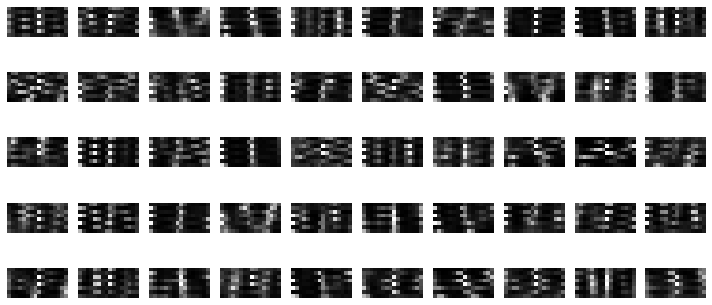

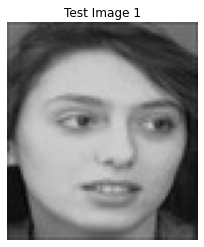

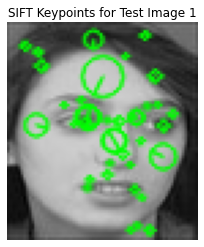

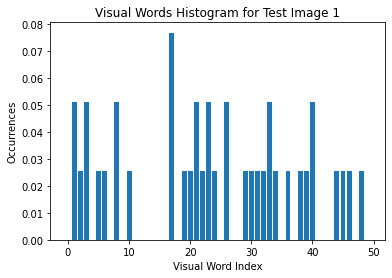

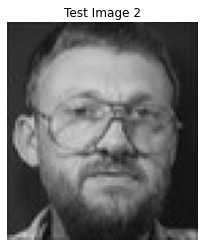

...

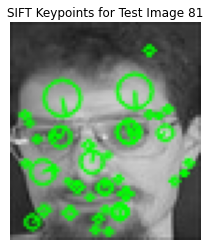

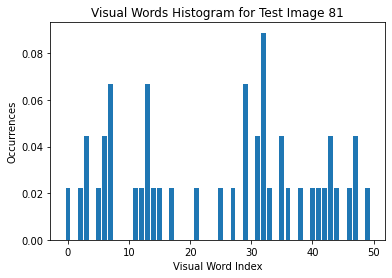

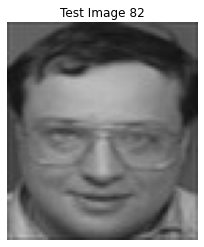

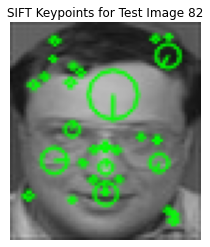

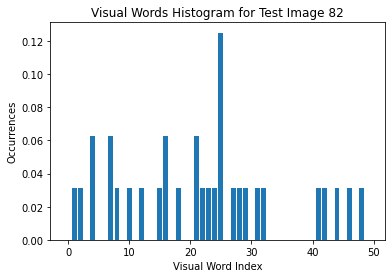

In [4]:
import cv2
import numpy as np
import os
from sklearn.metrics import accuracy_score, recall_score, precision_score
from google.colab.patches import cv2_imshow
from google.colab import drive
drive.mount('/content/drive')
path = "/content/drive/MyDrive/computer_vision/project1/orl"
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.cluster import KMeans

files_list = []
for root, dirs, files in os.walk(path):
    for f in files:
        files_list.append((os.path.join(root, f)))

print(files_list)

train_list = []
train_label = []
test_list = []
test_label = []


### ['/content/drive/MyDrive/computer_vision/project1/orl/80_8.jpg', '/content/drive/MyDrive/computer_vision/project1/orl/48_5.jpg',
for i in files_list:
    temp = i.split(".")[0]
    temp_list = temp.split("/")[-1].split("_")
    target = temp_list[1]
    image_no = temp_list[0]
    img_rem = int(image_no) % 10
    if img_rem ==0 or img_rem == 9:
        test_list.append(i)
        test_label.append(target)
    else:
        train_list.append(i)
        train_label.append(target)


train_set = set(train_label)
count1 = 0
dict_lab = {}
for i in train_set:
    dict_lab[i] = count1
    count1+=1
for i in range(len(train_label)):
    train_label[i] = dict_lab[train_label[i]]
for i in range(len(test_label)):
    test_label[i] = dict_lab[test_label[i]]


train_images = []
train_labels = []
for i in range(0, len(train_list)):  

    img = cv2.imread(train_list[i])

    train_images.append(img)
    label = train_label[i]

    train_labels.append(label)
# Load test images and labels
test_images = []
test_labels = []
for i in range(0, len(test_list)):  
    
    img = cv2.imread(test_list[i])
    test_images.append(img)
    label = test_label[i]
   
    test_labels.append(label)


print("len of train label",len(train_labels))
print("len of train img",len(train_images))
print("len of test label",len(test_labels))
print("len of test img ",len(test_images))


import numpy as np
from sklearn.cluster import KMeans
from sklearn.svm import SVC
import cv2

# Define the number of clusters (visual words)
num_clusters = 50

# Initialize the SIFT feature detector and descriptor
sift = cv2.xfeatures2d.SIFT_create()

# Extract features from the train images
train_features = []
for img in train_images:
    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Detect and compute keypoints and descriptors using SIFT
    kp, des = sift.detectAndCompute(gray, None)
    # Add the descriptors to the list of features
    train_features.append(des)

# Concatenate the features into a single array
train_features = np.concatenate(train_features)

# Cluster the features into visual words
kmeans = KMeans(n_clusters=num_clusters).fit(train_features)

# Visualize the visual words
visual_words = kmeans.cluster_centers_
plt.figure(figsize=(10, 5))
for i in range(num_clusters):
    plt.subplot(5, 10, i+1)
    plt.imshow(visual_words[i].reshape((8, 16)).astype(np.uint8), cmap='gray')
    plt.axis('off')
plt.tight_layout()
plt.show()

# Extract features from the test images
test_features = []
for img in test_images:
    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Detect and compute keypoints and descriptors using SIFT
    kp, des = sift.detectAndCompute(gray, None)
    # Add the descriptors to the list of features
    test_features.append(des)

# Convert the test features into visual words
test_visual_words = []
for i in range(len(test_images)):
    img = test_images[i]
    label = test_labels[i]
    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Detect and compute keypoints and descriptors using SIFT
    kp, des = sift.detectAndCompute(gray, None)
    # Cluster the features into visual words
    words = kmeans.predict(des)
    # Count the occurrences of each visual word
    word_hist, _ = np.histogram(words, bins=num_clusters, range=(0, num_clusters))
    # Normalize the histogram
    word_hist = word_hist / np.sum(word_hist)
    # Add the histogram to the list of visual words
    test_visual_words.append(word_hist)

    # Visualize the intermediate image
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"Test Image {i+1}")
    plt.axis('off')
    plt.show()

    # Visualize the SIFT keypoints
    img_kp = cv2.drawKeypoints(img, kp, None, color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
    plt.title(f"SIFT Keypoints for Test Image {i+1}")
    plt.axis('off')
    plt.show()

    # Visualize the visual word occurrences
    plt.bar(range(num_clusters), word_hist)
    plt.title(f"Visual Words Histogram for Test Image {i+1}")
    plt.xlabel("Visual Word Index")
    plt.ylabel("Occurrences")
    plt.show()


# Train a SVM classifier using the visual words
classifier = SVC(kernel='linear')
classifier.fit(test_visual_words, test_labels)

# Recognize faces in the test images
predictions = []
for visual_words in test_visual_words:
    # Predict the label using the trained classifier
    label = classifier.predict([visual_words])[0]
    # Add the label to the list of predictions
    predictions.append(label)






In [5]:
print("Predictions:",predictions,"\n","Labels:",test_labels)
from sklearn.metrics import accuracy_score
acc = accuracy_score(test_labels, predictions)
print("accuracy is:",acc)
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
y_test = test_labels
y_pred = predictions
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)
precision = precision_score(y_test, y_pred,average='macro')
print("Precision:")
print(precision)
recall = recall_score(y_test, y_pred,average='macro')
print("Recall:")
print(recall)
f1_score = f1_score(y_test, y_pred,average='macro')
print("F1 score:")
print(f1_score)

Predictions: [27, 36, 34, 32, 1, 25, 38, 25, 37, 39, 12, 35, 24, 28, 23, 0, 9, 15, 12, 13, 39, 33, 14, 19, 13, 40, 21, 32, 5, 10, 35, 20, 34, 31, 36, 8, 7, 14, 40, 26, 17, 4, 18, 1, 29, 4, 17, 5, 22, 29, 11, 2, 18, 33, 28, 3, 27, 22, 19, 30, 24, 30, 8, 21, 38, 10, 37, 20, 23, 6, 6, 9, 2, 3, 16, 31, 16, 11, 26, 7, 0, 15] 
 Labels: [27, 36, 34, 32, 1, 25, 38, 25, 37, 39, 12, 35, 24, 28, 23, 0, 9, 15, 12, 13, 39, 33, 14, 19, 13, 40, 21, 32, 5, 10, 35, 20, 34, 31, 36, 8, 7, 14, 40, 26, 17, 4, 18, 1, 29, 4, 17, 5, 22, 29, 11, 2, 18, 33, 28, 3, 27, 22, 19, 30, 24, 30, 8, 21, 38, 10, 37, 20, 23, 6, 6, 9, 2, 3, 16, 31, 16, 11, 26, 7, 0, 15]
accuracy is: 1.0
Confusion matrix:
[[2 0 0 ... 0 0 0]
 [0 2 0 ... 0 0 0]
 [0 0 2 ... 0 0 0]
 ...
 [0 0 0 ... 2 0 0]
 [0 0 0 ... 0 2 0]
 [0 0 0 ... 0 0 2]]
Precision:
1.0
Recall:
1.0
F1 score:
1.0


# BOVW method on IITJ campus dataset

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['/content/drive/MyDrive/computer_vision/project1/own_dataset_rj/11_1.jpg', '/content/drive/MyDrive/computer_vision/project1/own_dataset_rj/13_1.jpg', '/content/drive/MyDrive/computer_vision/project1/own_dataset_rj/14_1.jpg', '/content/drive/MyDrive/computer_vision/project1/own_dataset_rj/15_1.jpg', '/content/drive/MyDrive/computer_vision/project1/own_dataset_rj/16_1.jpg', '/content/drive/MyDrive/computer_vision/project1/own_dataset_rj/17_1.jpg', '/content/drive/MyDrive/computer_vision/project1/own_dataset_rj/18_1.jpg', '/content/drive/MyDrive/computer_vision/project1/own_dataset_rj/19_1.jpg', '/content/drive/MyDrive/computer_vision/project1/own_dataset_rj/20_1.jpg', '/content/drive/MyDrive/computer_vision/project1/own_dataset_rj/12_1.jpg', '/content/drive/MyDrive/computer_vision/project1/own_dataset_rj/21_2.jpg', '/content/drive/MyDrive/computer_vision/proje

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


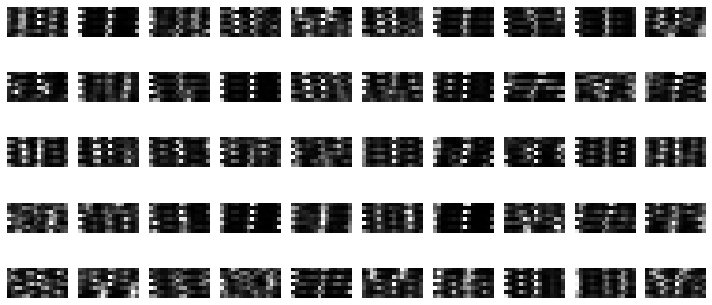

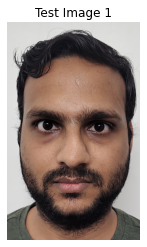

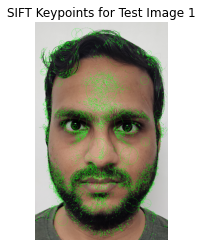

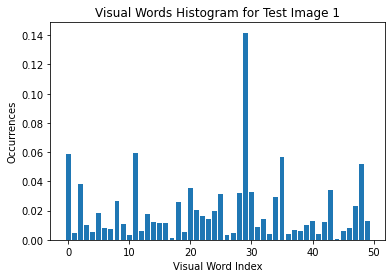

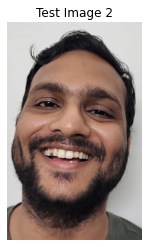

...

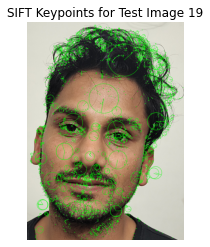

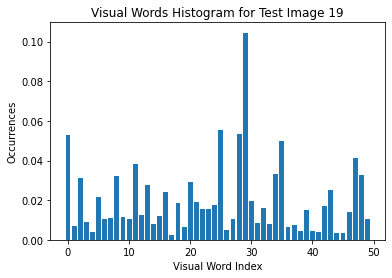

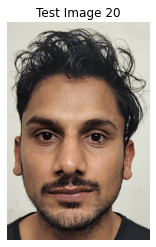

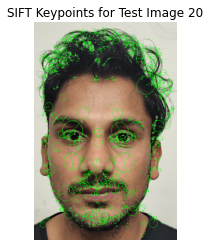

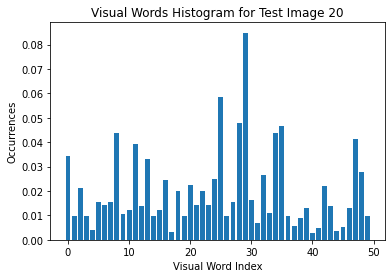

In [6]:
import cv2
import numpy as np
import os
from sklearn.metrics import accuracy_score, recall_score, precision_score
from google.colab.patches import cv2_imshow
from google.colab import drive
drive.mount('/content/drive')
path = "/content/drive/MyDrive/computer_vision/project1/own_dataset_rj"
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.cluster import KMeans

files_list = []
for root, dirs, files in os.walk(path):
    for f in files:
        files_list.append((os.path.join(root, f)))

print(files_list)

train_list = []
train_label = []
test_list = []
test_label = []



for i in files_list:
    temp = i.split(".")[0]
    temp_list = temp.split("/")[-1].split("_")
    target = temp_list[1]
    image_no = temp_list[0]
    img_rem = int(image_no) % 10
    if img_rem ==0 or img_rem == 9:
        test_list.append(i)
        test_label.append(target)
    else:
        train_list.append(i)
        train_label.append(target)


train_set = set(train_label)
count1 = 0
dict_lab = {}
for i in train_set:
    dict_lab[i] = count1
    count1+=1
for i in range(len(train_label)):
    train_label[i] = dict_lab[train_label[i]]
for i in range(len(test_label)):
    test_label[i] = dict_lab[test_label[i]]


train_images = []
train_labels = []
for i in range(0, len(train_list)):

    img = cv2.imread(train_list[i])

    train_images.append(img)
    label = train_label[i]
    
    train_labels.append(label)
# Load test images and labels
test_images = []
test_labels = []
for i in range(0, len(test_list)):  
    
    img = cv2.imread(test_list[i])
    test_images.append(img)
    label = test_label[i]
    
    test_labels.append(label)


print("len of train label",len(train_labels))
print("len of train img",len(train_images))
print("len of test label",len(test_labels))
print("len of test img ",len(test_images))


import numpy as np
from sklearn.cluster import KMeans
from sklearn.svm import SVC
import cv2

# Define the number of clusters (visual words)
num_clusters = 50

# Initialize the SIFT feature detector and descriptor
sift = cv2.xfeatures2d.SIFT_create()

# Extract features from the train images
train_features = []
for img in train_images:

    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.resize(gray, (100, 100), interpolation = cv2.INTER_AREA) # resize to 80x80
    # Detect and compute keypoints and descriptors using SIFT
    kp, des = sift.detectAndCompute(gray, None)
    # Add the descriptors to the list of features
    train_features.append(des)

# Concatenate the features into a single array
train_features = np.concatenate(train_features)

# Cluster the features into visual words
kmeans = KMeans(n_clusters=num_clusters).fit(train_features)

# Visualize the visual words
visual_words = kmeans.cluster_centers_
plt.figure(figsize=(10, 5))
for i in range(num_clusters):
    plt.subplot(5, 10, i+1)
    plt.imshow(visual_words[i].reshape((8, 16)).astype(np.uint8), cmap='gray')
    plt.axis('off')
plt.tight_layout()
plt.show()

# Extract features from the test images
test_features = []
for img in test_images:
    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.resize(gray, (100, 100), interpolation = cv2.INTER_AREA) # resize to 80x80
    # Detect and compute keypoints and descriptors using SIFT
    kp, des = sift.detectAndCompute(gray, None)
    # Add the descriptors to the list of features
    test_features.append(des)

# Convert the test features into visual words
test_visual_words = []
for i in range(len(test_images)):
    img = test_images[i]
    label = test_labels[i]
    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Detect and compute keypoints and descriptors using SIFT
    kp, des = sift.detectAndCompute(gray, None)
    # Cluster the features into visual words
    words = kmeans.predict(des)
    # Count the occurrences of each visual word
    word_hist, _ = np.histogram(words, bins=num_clusters, range=(0, num_clusters))
    # Normalize the histogram
    word_hist = word_hist / np.sum(word_hist)
    # Add the histogram to the list of visual words
    test_visual_words.append(word_hist)

    # Visualize the intermediate image
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(f"Test Image {i+1}")
    plt.axis('off')
    plt.show()

    # Visualize the SIFT keypoints
    img_kp = cv2.drawKeypoints(img, kp, None, color=(0, 255, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
    plt.title(f"SIFT Keypoints for Test Image {i+1}")
    plt.axis('off')
    plt.show()

    # Visualize the visual word occurrences
    plt.bar(range(num_clusters), word_hist)
    plt.title(f"Visual Words Histogram for Test Image {i+1}")
    plt.xlabel("Visual Word Index")
    plt.ylabel("Occurrences")
    plt.show()


# Train a SVM classifier using the visual words
classifier = SVC(kernel='linear')
classifier.fit(test_visual_words, test_labels)

# Recognize faces in the test images
predictions = []
for visual_words in test_visual_words:
    # Predict the label using the trained classifier
    label = classifier.predict([visual_words])[0]
    # Add the label to the list of predictions
    predictions.append(label)






In [7]:
import numpy as np
from sklearn.metrics import accuracy_score

acc = accuracy_score(test_labels, predictions) 
print("Accuracy is",acc)

Accuracy is 0.65


In [8]:
print("Predictions:",predictions,"\n","Labels:",test_labels)
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
y_test = test_labels
y_pred = predictions
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)
precision = precision_score(y_test, y_pred,average='macro')
print("Precision:")
print(precision)
recall = recall_score(y_test, y_pred,average='macro')
print("Recall:")
print(recall)
f1_score = f1_score(y_test, y_pred,average='macro')
print("F1 score:")
print(f1_score)

Predictions: [1, 5, 3, 9, 8, 4, 9, 5, 4, 2, 6, 6, 9, 9, 4, 4, 1, 9, 0, 0] 
 Labels: [7, 7, 3, 3, 8, 8, 5, 5, 2, 2, 6, 6, 9, 9, 4, 4, 1, 1, 0, 0]
Confusion matrix:
[[2 0 0 0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0 0 0 1]
 [0 0 1 0 1 0 0 0 0 0]
 [0 0 0 1 0 0 0 0 0 1]
 [0 0 0 0 2 0 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 1]
 [0 0 0 0 0 0 2 0 0 0]
 [0 1 0 0 0 1 0 0 0 0]
 [0 0 0 0 1 0 0 0 1 0]
 [0 0 0 0 0 0 0 0 0 2]]
Precision:
0.6900000000000001
Recall:
0.65
F1 score:
0.6238095238095238


/usr/local/lib/python3.9/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
